# <img src="https://img.icons8.com/bubbles/100/000000/3d-glasses.png" style="height:50px;display:inline"> EE 046746 - Technion - Computer Vision


## Homework 3 - Segmentation and Homographies
---

### <a style='color:red'> Due Date: 6.6.2023 </a>

### <img src="https://img.icons8.com/bubbles/50/000000/upload-to-cloud.png" style="height:50px;display:inline"> Submission Guidelines
---
#### READ THIS CAREFULLY
* Submission only in **pairs**.
* **No handwritten submissions**.
* You can choose your working environment:
    * You can work in a `Jupyter Notebook`, locally with <a href="https://www.anaconda.com/distribution/">Anaconda</a> or online on <a href="https://colab.research.google.com/">Google Colab</a>
  * **Important**: Colab also supports running code on GPU, so if you don't have one, Colab is the way to go. To enable GPU on Colab, in the menu: `Runtime` $\rightarrow$  `Change Runtime Type` $\rightarrow$`GPU`.
    * You can work in a Python IDE such as <a href="https://www.jetbrains.com/pycharm/">PyCharm</a> or <a href="https://code.visualstudio.com/">Visual Studio Code</a>.
        * Both also allow opening/editing Jupyter Notebooks.

* Make sure you submit your exercise according to the requirements in the <a href="https://moodle.technion.ac.il/pluginfile.php/1823033/mod_resource/content/2/Homework%20guidelines.pdf">"Homework submission guidelines"</a> file that appears in the course website (Moodle). 
* **The code should run both on CPU and GPU without manual modifications**, require no special preparation and run on every computer.
* Be precise, we expect on point answers.
* Submission on the course website (Moodle).

### <img src="https://img.icons8.com/cute-clipart/64/000000/youtube.png" style="height:50px;display:inline"> Video Submission (YouTube - Optional)
---
* In this exercise you are going to produce a video.
* In addition to submiting this video in the `\output` folder (**MANDATORY**), we are also giving you the option to upload it to YouTube and submit the link in a different section on the website (just below the original submission section).
    * This will benefit you when you explain your expertise in Computer Vision (e.g., in a job interview).
    * We also may make something nice with your works at the end of the course.
* If you don't want to make your video public, you can change its visibility to "Unlisted", and then it can only be accessed via link:

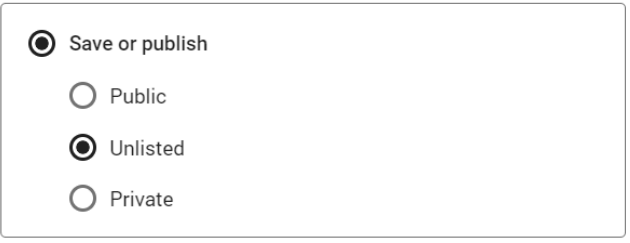

* Finally, submit the link on the course website and answer if you are okay with making this video public:

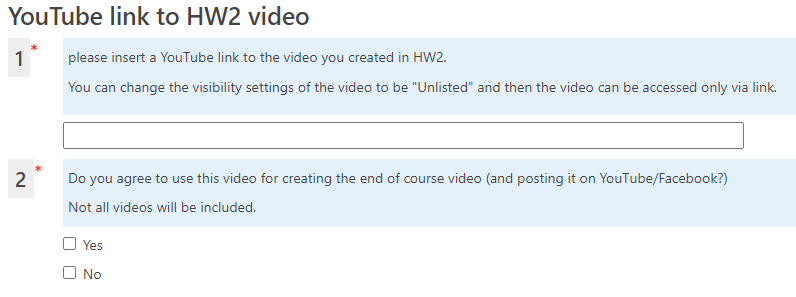


### <img src="https://img.icons8.com/dusk/64/000000/python.png" style="height:50px;display:inline"> Python Libraries
---

* `numpy`
* `matplotlib`
* `pytorch` (and `torchvision`)
* `opencv` (or `scikit-image`)
* `scikit-learn`
* Anything else you need (`PIL`, `os`, `pandas`, `csv`, `json`,...)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import os

# Definition of device - global for all models
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### <img src="https://img.icons8.com/bubbles/50/000000/checklist.png" style="height:50px;display:inline"> Tasks
---
* In all tasks, you should document your process and results in a report file (which will be saved as `.pdf`). 
* You can reference your code in the report file, but no need for actual code in this file, the code is submitted in a seprate folder as explained above.

#### Part 1 - Classic Vs. Deep Learning-based Semantic Segmentation
---

1. Load the images in the `./data/frogs` and `./data/horses` folders and display them.

In [2]:
def load(folder_paths):
    images = []
    for folder_path in folder_paths:
        for filename in os.listdir(folder_path):
            if filename.endswith('jpg') or filename.endswith('png'):
                image_path = os.path.join(folder_path, filename)
                image = Image.open(image_path)
                images.append(image)
    return images

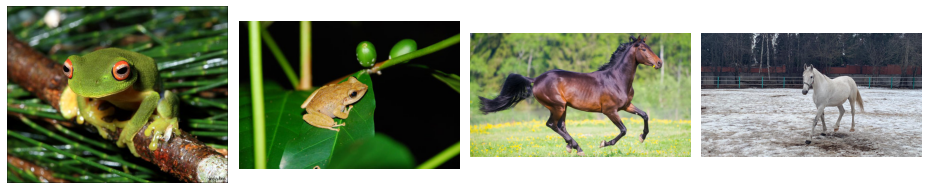

In [3]:
paths = ['./data/frogs', './data/horses']
images = load(paths)
fig, axs = plt.subplots(1, len(images), figsize=(13,10))
for i, ax in enumerate(axs.ravel()):
    ax.imshow(images[i])
    ax.set_axis_off()
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout(), plt.show();

2. Pick 1 classic method for segmentation and 1 deep learning-based method and segment the given images. Display the results.
    * **Briefly** summarize each method you picked and discuss the advantages and disadvantages of each method. In your answer, relate to the results you received in this section.
    * You can use a ready implementation from the internet or OpenCV, no need to implement it yourselves.
    * Note: the classic method **must not** use any neural network.

In [4]:
#Classic Segmentation by cv2.grabcut
def grabcut(rect, img):
    mask = np.zeros(img.shape[:2],np.uint8)
    bgdModel = np.zeros((1,65), np.float64)
    fgdModel = np.zeros((1,65), np.float64)
    cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    img_final = img*mask2[:,:,np.newaxis]
    return img_final, mask2

In [5]:
rects = [(100,50,400,300), (150,150,200,200), (1,1,950,600), (600,150,400,550)] #[x,y,W,H] coordinates of the rectangle
np_images = [np.array(img) for img in images]
segmented_classic=[]
for i, img in enumerate(np_images):
  segmented, mask = grabcut(rects[i], img)
  segmented_classic.append(segmented)

In [6]:
from torchvision.models.segmentation import deeplabv3_resnet101

#download and load the pre‑trained model
model = deeplabv3_resnet101(pretrained=True)

# model = torch.hub.load('pytorch/vision', 'deeplabv3_resnet101', pretrained=True)
#put in inference mode
model.eval()

# run the deeplabv3_resnet101
# Input: model - torch model (deeplab), device - if we are using cpu or gpu, img - a cv2 image
# label - optional input, if used it will show only the label chosen in the mask. (imagenet label)
# Output: masked_img - object segmented, mask - mask of the object segmented

def deep_segmentation(model, device, img, label=None, flag = False):
    #input_image = Image.open(img)

    # define the pre-processing steps
    # image->tensor, normalization
    preprocess = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    # perform pre-processing
    input_tensor = preprocess(img)
    input_batch = input_tensor.unsqueeze(0) # create a mini-batch of size 1 as expected by the model
    # send to device
    model = model.to(device)
    input_batch = input_batch.to(device)

    # forward pass
    with torch.no_grad():
     output = model(input_batch)['out'][0]
    output_predictions = output.argmax(0)

    # create a color pallette, selecting a color for each class
    palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
    colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
    colors = (colors % 255).numpy().astype("uint8")
    # plot the semantic segmentation predictions of 21 classes in each color
    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(img.size)
    r.putpalette(colors)
    labels = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle',
     'bus', 'car', 'cat', 'chair', 'cow',
     'diningtable','dog', 'horse', 'motorbike', 'person',
              'pottedplant','sheep', 'sofa', 'train', 'tvmonitor']
    # print(["{}: {}".format(i + 1, labels[i]) for i in range(len(labels))])
    # what labels were recognized?
    top_labels_found = np.unique(output_predictions.cpu().numpy())
    # create a mask
    mask = torch.zeros_like(output_predictions).float().to(device)
    if not label:
        mask[output_predictions == top_labels_found.max()] = 1 # 12 is dog
    else:
        mask[output_predictions == label] = 1 # 12 is dog, 15 person
    # mask[output_predictions == 15] = 1 # 15 is person
    masked_img = img * mask.unsqueeze(2).byte().cpu().numpy()
    if flag:
        fig = plt.figure(figsize=(15,15))
        ax = fig.add_subplot(1,2,1)
        ax.imshow(r)
        ax.set_axis_off()
        ax = fig.add_subplot(1,2,2)
        ax.imshow(masked_img)
        ax.set_axis_off()
    return masked_img, r, mask.unsqueeze(2).byte().cpu().numpy(),top_labels_found.max()

In [7]:
segmented_nn=[]
mask_nn=[]
for img in images:
  img_segmented, _, mask, _= deep_segmentation(model, device, img)
  segmented_nn.append(img_segmented)
  mask_nn.append(mask)

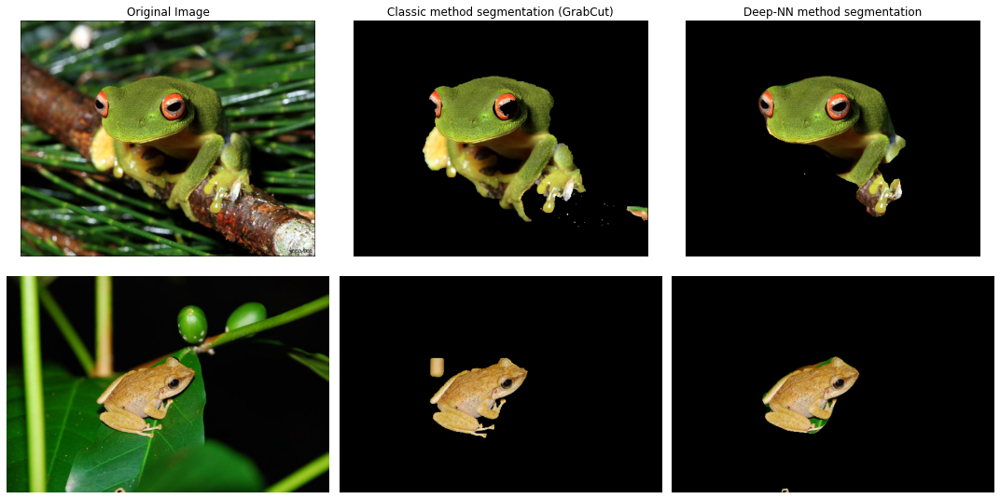

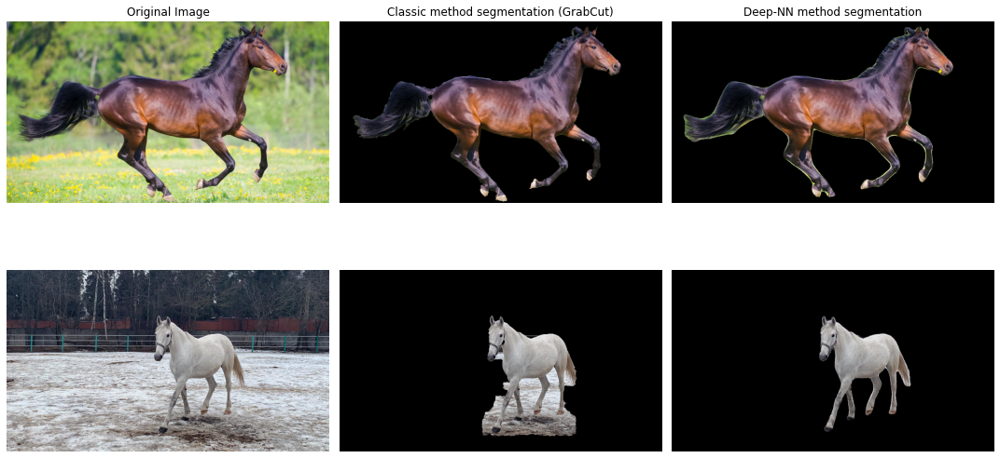

In [8]:
fig=plt.figure(figsize=(15,15))
for i in range(2):
    ax=fig.add_subplot(4,3,i*3+1)
    if i==0: ax.set_title("Original Image")
    ax.imshow(images[i]),ax.axis('off')

    ax=fig.add_subplot(4,3,i*3+2)
    if i==0: ax.set_title("Classic method segmentation (GrabCut)")
    ax.imshow(segmented_classic[i]),ax.axis('off')

    ax=fig.add_subplot(4,3,i*3+3)
    if i==0: ax.set_title("Deep-NN method segmentation")
    ax.imshow(segmented_nn[i]),ax.axis('off')
plt.tight_layout(), plt.show();
fig=plt.figure(figsize=(15,15))
for i in range(2):
    ax=fig.add_subplot(4,3,i*3+1)
    if i==0: ax.set_title("Original Image")
    ax.imshow(images[i+2]),ax.axis('off')

    ax=fig.add_subplot(4,3,i*3+2)
    if i==0: ax.set_title("Classic method segmentation (GrabCut)")
    ax.imshow(segmented_classic[i+2]),ax.axis('off')

    ax=fig.add_subplot(4,3,i*3+3)
    if i==0: ax.set_title("Deep-NN method segmentation")
    ax.imshow(segmented_nn[i+2]),ax.axis('off')

plt.tight_layout(), plt.show();

3. Pick 3 images (download from the internet or take them yourself) that satisfy the following, and dispaly them:
    * One image of a living being (human, animal,...).
    * One image of commonly-used object (car, chair, smartphone, glasses,...).
    * One image of not-so-commonly-used object (fire extinguisher, satellite,... **BE CREATIVE**).

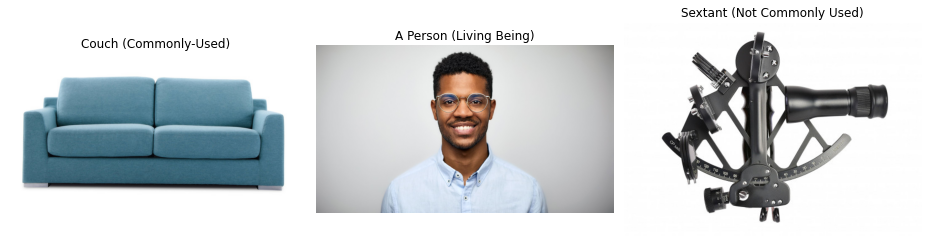

In [9]:
path = ['./data/my_data/part1']
my_images = load(path)
titles = ['Couch (Commonly-Used)', 'A Person (Living Being)', 'Sextant (Not Commonly Used)']
fig, axs = plt.subplots(1, len(my_images), figsize=(13,10))
for i, ax in enumerate(axs.ravel()):
    ax.imshow(my_images[i])
    ax.set_title(titles[i])
    ax.set_axis_off()
    ax.set_xticks([])
    ax.set_yticks([])
    fig.tight_layout(), fig.subplots_adjust()
plt.show()

4. Apply each method (one classic and one deep learning-based) on the 3 images. Display the results (mask and segmented image).
    * Which method performed better on each image? Describe your thoughts on why one method is better than the other.
    * For the classic method you can change parameters per-image, document them in the report.
    * You can add manual post-processing to get a mask if needed. If you do that, document in your report "how hard" you had to work in the post-processing stage, as it's an indication of the quality of the method.

In [10]:
rects = [(50,50,700,300), (400,0,1100,1080), (50,50,400,325)] #Couch - Person - Sextant

np_my_images = [np.array(img) for img in my_images]
my_segmented_classic=[]
my_mask_classic=[]
for i, img in enumerate(np_my_images):
    segmented, mask = grabcut(rects[i], img)
    my_segmented_classic.append(segmented)
    my_mask_classic.append(mask)


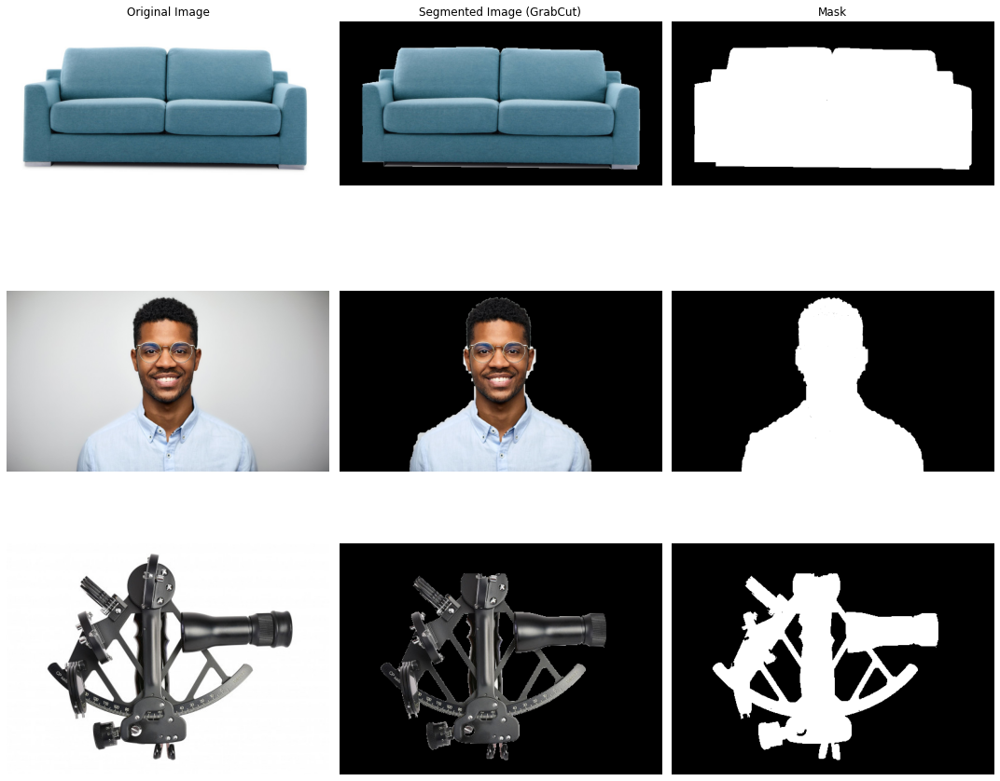

In [11]:
fig=plt.figure(figsize=(15,15))
for i,img in enumerate(my_images):
    ax=fig.add_subplot(3,3,i*3+1)
    if i==0: ax.set_title("Original Image")
    ax.imshow(my_images[i]), ax.axis('off')

    ax=fig.add_subplot(3,3,i*3+2)
    if i==0: ax.set_title("Segmented Image (GrabCut)")
    ax.imshow(my_segmented_classic[i]), ax.axis('off')

    ax=fig.add_subplot(3,3,i*3+3)
    if i==0: ax.set_title("Mask")
    ax.imshow(my_mask_classic[i], cmap='gray'),ax.axis('off')
    fig.tight_layout() , fig.subplots_adjust()
plt.show()

In [12]:
my_segmented_nn=[]
my_mask_nn=[]

for i, img in enumerate(my_images):
  segmented,_ , mask ,_ =deep_segmentation(model, device, img)
  my_segmented_nn.append(segmented)
  my_mask_nn.append(mask)


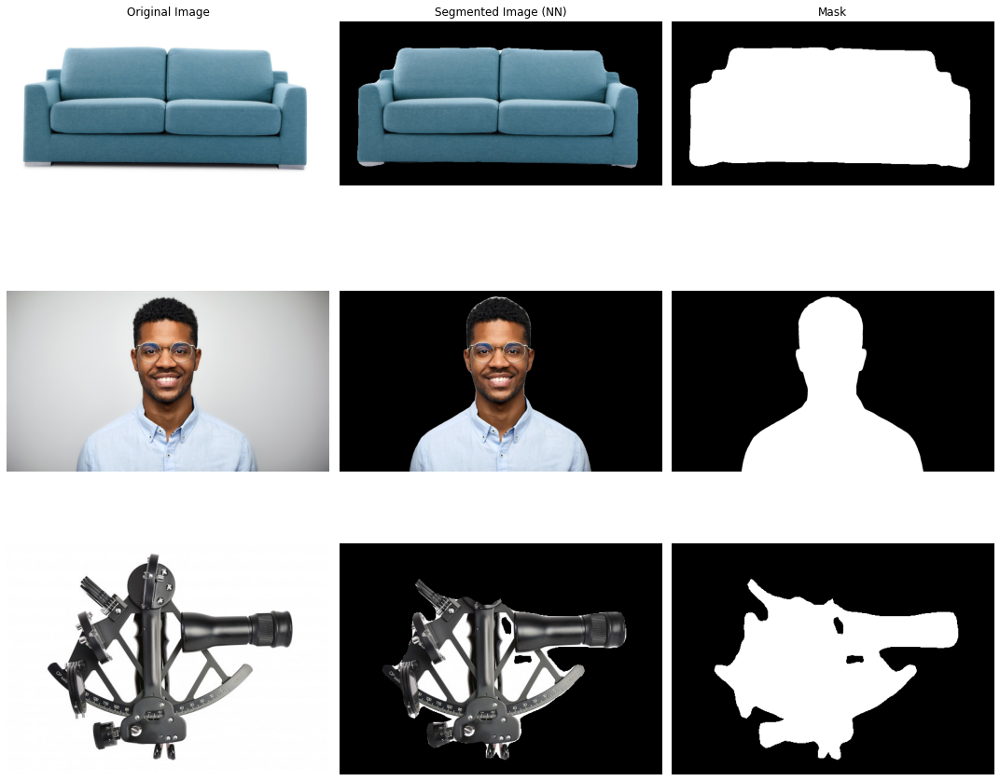

In [13]:
fig=plt.figure(figsize=(15,15))
for i,img in enumerate(my_images):
    ax=fig.add_subplot(3,3,i*3+1)
    if i==0: ax.set_title("Original Image")
    ax.imshow(my_images[i]), ax.axis('off')

    ax=fig.add_subplot(3,3,i*3+2)
    if i==0: ax.set_title("Segmented Image (NN)")
    ax.imshow(my_segmented_nn[i]), ax.axis('off')

    ax=fig.add_subplot(3,3,i*3+3)
    if i==0: ax.set_title("Mask")
    ax.imshow(my_mask_nn[i], cmap='gray'),ax.axis('off')
    fig.tight_layout() , fig.subplots_adjust()
plt.show()

5. As you probably have noticed, segmentation can be rough around the edges, i.e., the mask is not perfect and may be noisy around the edges. What can be done to fix or at least alleviate this problem? Your suggestions can be in pre-processing, inside the segmentation algorithm or in post-processing.

#### Part 2 - Jurrasic Fishbach
---
In this part you are going to apply segmentation on a video, and integrate with other elements.

<img src="https://lh3.googleusercontent.com/5zF16wl-tdE1FZCuVsrNxHWzfa6uXo4hYE_BGabKnGovw2W-bIT9gnZlAgU8nUoK=w412-h220-rw">

1. Film a short video of yourself (you can use your phone for that), but without too much camera movement. You on the other hand, can move however you want (we expect you to). Convert the video to frames and resize the images for a reasonable not too high resolution (lower than 720p ~ 1280x720 pixles). You can use the function in `./code/frame_video_convert.py` to help you. Display 2 frames in the report.
2. Segment yourself out of the video (frame-by-frame) using one of the methods (classic or deep). Display 2 frames in the report.
3. Pick one of the objects in the supplied videos file (`./data/video_models`), convert it to images and segement it out using one of the methods from Part 1(classic or deep). Display 2 frames in the report. You can choose another object from: https://pixabay.com/videos/search/green%20screen/.
    * Explain how you performed the sementation for this specific type of video (i.e., green-screen videos). Did you  use a simple/classic method? Deep method? Combined both?
4. Put it all together - pick a background, put yourself and the segemented object on the background. Stich it frame-by-frame (don't make the video too long or it will take a lot of time, 10secs maximum). Display 2 frames of the result in your report. Convert the frames back to video. You can use the function in `frame_video_convert.py` to help you.
    * Tip: To make it look good, you can resize the images, create a mapping from pixel locations in the original image to pixels locations in the new image.
    * You should submit the final video in the `./output` folder (**MANDATORY**), and upload it to YouTube (**OPTIONAL**) as instructed above.
    * We expect some creative results, this can benefit you a lot when you want to demonstrate your Computer Vision abilities.

1. Film a short video of yourself (you can use your phone for that), but without too much camera movement. You on the other hand, can move however you want (we expect you to). Convert the video to frames and resize the images for a reasonable not too high resolution (lower than 720p ~ 1280x720 pixles). You can use the function in `./code/frame_video_convert.py` to help you. Display 2 frames in the report.
2. Segment yourself out of the video (frame-by-frame) using one of the methods (classic or deep). Display 2 frames in the report.

In [14]:
"""
Author: Tal Daniel
"""
import cv2
import numpy as np
import glob
import os

import re

def get_frame_number(filename):
    match = re.search(r'\d+', filename)
    if match:
        return int(match.group())
    else:
        return 0

def image_seq_to_video(imgs_path, output_path='./video.mp4', fps=15.0):
    output = output_path
    img_array = []
    for filename in sorted(glob.glob(os.path.join(imgs_path, '*.jpg')), key=get_frame_number):
        img = cv2.imread(filename)
        height, width, layers = img.shape
        # img = cv2.resize(img, (width // 2, height // 2))
        img = cv2.resize(img, (width, height))
        height, width, layers = img.shape
        size = (width, height)
        img_array.append(img)

    print(size)
    print("writing video...")
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Be sure to use lower case
    out = cv2.VideoWriter(output, fourcc, fps, size)
    # out = cv2.VideoWriter('project.avi', cv2.VideoWriter_fourcc(*'DIVX'), 15, size)

    for i in range(len(img_array)):
        out.write(img_array[i])
    out.release()
    print("saved video @ ", output)


def video_to_image_seq(vid_path, output_path='./datasets/OTB/img/Custom/'):
    os.makedirs(output_path, exist_ok=True)
    vidcap = cv2.VideoCapture(vid_path)
    success, image = vidcap.read()
    image = cv2.resize(image, (1024, 576))
    count = 0
    print("converting video to frames...")
    while success:
        fname = str(count).zfill(4)
        cv2.imwrite(os.path.join(output_path, fname + ".jpg"), image)  # save frame as JPEG file
        success, image = vidcap.read()
        if success: image = cv2.resize(image, (1024, 576))
        # print('Read a new frame: ', success)
        count += 1
    print("total frames: ", count)

In [15]:
#Classic Segmentation by cv2.grabcut
def grabcut2(rect, img, flag = False): #Flag is used for plotting a figure
    mask = np.zeros(img.shape[:2],np.uint8)
    bgdModel = np.zeros((1,65), np.float64)
    fgdModel = np.zeros((1,65), np.float64)
    cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    img_final = img*mask2[:,:,np.newaxis]
    if flag:
        fig=plt.figure(figsize=(15,15))
        ax=fig.add_subplot(1,2,1)
        img_final = cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB)
        ax.imshow(img_final), ax.axis('off')
        ax=fig.add_subplot(1,2,2)
        ax.imshow(mask2, cmap='gray'), ax.axis('off')
    return img_final, mask2

In [16]:
from torchvision.models.segmentation import deeplabv3_resnet101

model = deeplabv3_resnet101(pretrained=True)

model.eval()
labels = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle',
         'bus', 'car', 'cat', 'chair', 'cow',
         'diningtable','dog', 'horse', 'motorbike', 'person',
                  'pottedplant','sheep', 'sofa', 'train', 'tvmonitor']

def deep_segmentation2(model, device, img, flag = True, label=None): #Flag is used for plotting a figure
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    input_image = Image.fromarray(img)
    # define the pre-processing steps
    # image->tensor, normalization
    preprocess = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    # perform pre-processing
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0) # create a mini-batch of size 1 as expected by the model
    # send to device
    model = model.to(device)
    input_batch = input_batch.to(device)

    # forward pass
    with torch.no_grad():
     output = model(input_batch)['out'][0]
    output_predictions = output.argmax(0)

    # print("output shape: ", output.shape)
    # print("output_predictions shape: ", output_predictions.shape)

    # create a color pallette, selecting a color for each class
    palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
    colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
    colors = (colors % 255).numpy().astype("uint8")
    # plot the semantic segmentation predictions of 21 classes in each color
    r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
    r.putpalette(colors)

    # print(["{}: {}".format(i + 1, labels[i]) for i in range(len(labels))])
    # what labels were recognized?
    top_labels_found = np.unique(output_predictions.cpu().numpy())
    # create a mask
    mask = torch.zeros_like(output_predictions).float().to(device)
    if not label:
        mask[output_predictions == top_labels_found.max()] = 1 # 12 is dog
    else:
        mask[output_predictions == label] = 1 # 12 is dog, 15 person
    # mask[output_predictions == 15] = 1 # 15 is person
    masked_img = input_image * mask.unsqueeze(2).byte().cpu().numpy()
    # plot
    if flag:
        fig = plt.figure(figsize=(15,15))
        ax = fig.add_subplot(1,2,1)
        ax.imshow(r)
        ax.set_axis_off()
        ax = fig.add_subplot(1,2,2)
        ax.imshow(masked_img)
        ax.set_axis_off()
    return masked_img, mask.cpu().numpy()


In [17]:
vid_path = './data/my_data/nir.mp4'
output_path = './video_images_nir/'
os.makedirs(output_path, exist_ok=True)
for f in os.listdir(output_path):
    os.remove(os.path.join(output_path, f))
video_to_image_seq(vid_path, output_path)

converting video to frames...
total frames:  168


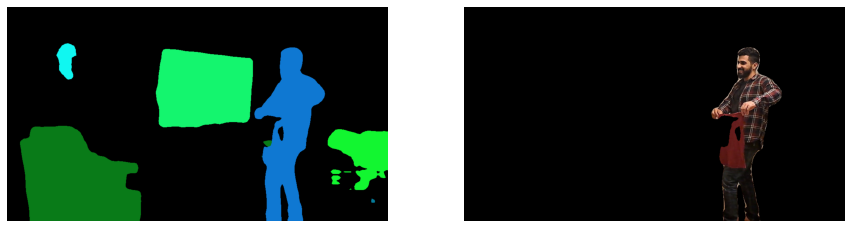

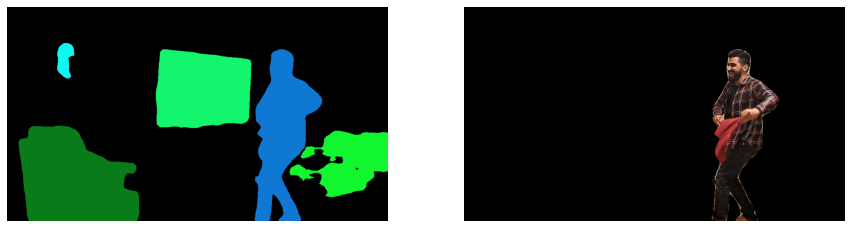

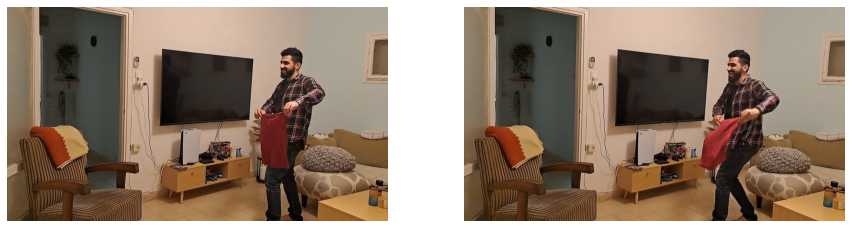

In [18]:
seg_imgs = []
seg_masks = []
saved_frames_idx=[3, 150]
saved_frames=[]
for i, file in enumerate(glob.glob(os.path.join(output_path,'*'))):
    flag = False
    img = cv2.imread(file)
    if i in saved_frames_idx:
        flag = True
        saved_frames.append(img)

    segmented_img, mask = deep_segmentation2(model, device, img, flag, 15)
    seg_imgs.append(segmented_img)
    seg_masks.append(mask)

    # os.makedirs("./temp/segmented_imgs/", exist_ok=True)
    # Image.fromarray(segmented_img).save("./temp/segmented_imgs/"+str(i)+".jpg")

shape = img.shape[1::-1]

fig = plt.figure(figsize=(15,15))
for i,img in enumerate(saved_frames):
  ax = fig.add_subplot(1,2,i+1)
  ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  ax.set_axis_off()
  fig.show

3. Pick one of the objects in the supplied videos file (`./data/video_models`), convert it to images and segement it out using one of the methods from Part 1(classic or deep). Display 2 frames in the report. You can choose another object from: https://pixabay.com/videos/search/green%20screen/.
    * Explain how you performed the sementation for this specific type of video (i.e., green-screen videos). Did you  use a simple/classic method? Deep method? Combined both?

In [19]:
video_model_path = './data/my_data/my_dinosaur.mp4'
seq_path = './video_images_dinosaur'
os.makedirs(seq_path, exist_ok=True)
for f in os.listdir(seq_path):
    os.remove(os.path.join(seq_path, f))
video_to_image_seq(video_model_path, seq_path)

converting video to frames...
total frames:  217


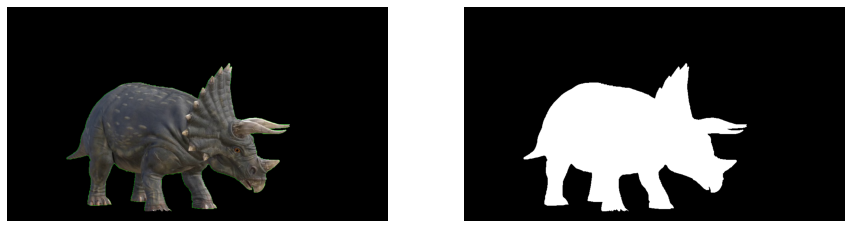

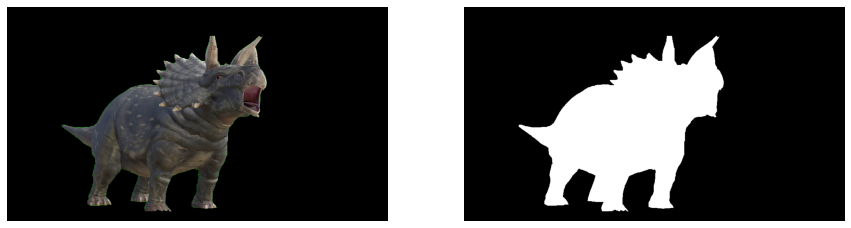

In [20]:
start_from = 49 # number of frames to start from in the video
seg_imgs_vidmodel = []
seg_masks_vidmodel = []
rect = (130, 80, 630, 470)
print_flag = True
for i, file in enumerate(glob.glob(os.path.join(seq_path,'*'))):
    if i < start_from: continue
    flag = True if i in [54, 108] else False
    img = cv2.imread(file)
    segmented_img_classic, mask_classic = grabcut2(rect, img, flag)
    seg_imgs_vidmodel.append(segmented_img_classic)
    seg_masks_vidmodel.append(mask_classic)

In [21]:
bg_path = './data/my_data/bullfight_arena.jpg'
bg_img = cv2.resize(cv2.imread(bg_path), shape)

In [22]:
output_seq_path = './output_sequence/'
os.makedirs(output_seq_path, exist_ok=True)
for f in os.listdir(output_seq_path):
    os.remove(os.path.join(output_seq_path, f))

In [23]:
# #Adjust the dinosaur a bit
shift_x = 100
shift_y = -25
transformation_matrix = (1, 0, shift_x, 0, 1, shift_y)

transformed_vidmodel = []
transformed_masks_vidmodel = []

for i in range(len(seg_imgs_vidmodel)):

    image_data = seg_imgs_vidmodel[i]
    mask_data = seg_masks_vidmodel[i].astype(np.uint8)

    image = Image.fromarray(image_data)
    mask = Image.fromarray(mask_data*255)

    transformed_image = image.transform(image.size, Image.AFFINE, transformation_matrix)
    transformed_mask = mask.transform(mask.size, Image.AFFINE, transformation_matrix)

    transformed_vidmodel.append(transformed_image)
    transformed_masks_vidmodel.append(transformed_mask)

In [24]:
#Adjust Nir a bit to the right
shift_amount = -100
transformation_matrix = (1, 0, shift_amount, 0, 1, 0)

transformed_nir = []
transformed_masks_nir = []

for i in range(len(seg_imgs)):

    image_data = seg_imgs[i]
    mask_data = seg_masks[i].astype(np.uint8)

    image = Image.fromarray(image_data)
    mask = Image.fromarray(mask_data*255)

    transformed_image = image.transform(image.size, Image.AFFINE, transformation_matrix)
    transformed_mask = mask.transform(mask.size, Image.AFFINE, transformation_matrix)

    transformed_nir.append(transformed_image)
    transformed_masks_nir.append(transformed_mask)

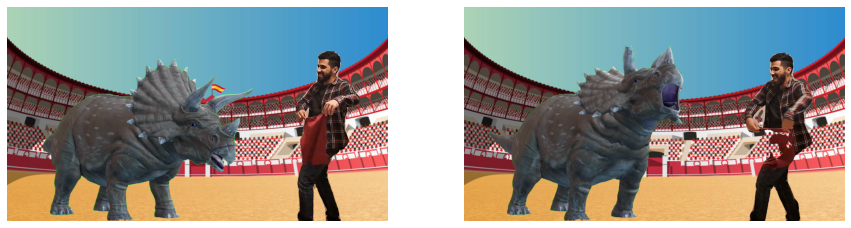

In [25]:
#The Video Sequence
saved_frames=[]
for i in range(len(seg_imgs)):
    bg = Image.fromarray(cv2.cvtColor(bg_img, cv2.COLOR_BGR2RGB)) #Background
    cur_model = transformed_vidmodel[i]
    cur_nir = transformed_nir[i]
    model_mask = transformed_masks_vidmodel[i]
    nir_mask = transformed_masks_nir[i]
    bg.paste(cur_model, (0,0), model_mask)
    bg.paste(cur_nir, (0,0), nir_mask)
    bg.save(output_seq_path+str(i)+".jpg")

    saved_frames_idx=(24,50)
    if i in saved_frames_idx:
      saved_frames.append(bg)


fig = plt.figure(figsize=(15,15))
for i,img in enumerate(saved_frames):
  ax = fig.add_subplot(1,2,i+1)
  ax.imshow(img)
  ax.set_axis_off()
  fig.show

In [26]:
video_output_path = './output/video.mp4'
image_seq_to_video(output_seq_path, video_output_path,fps=18)

(1024, 576)
writing video...
saved video @  ./output/video.mp4



#### Part 3 - Planar Homographies: 
---
After we saw how descriptors are implemented and performed, now we will see how to use them for homographis.

In this part you will implement an image stitching algorithm, and will learn how to stitch several images of the same scene into a panorama. First, we’ll concentrate on the case of two images and then extend to several images.

For the following tasks:
- **You are not allowed to use OpenCV/Scipy or any other "ready to use" functions when you are asked to implement a function (you can still use the functions to save and load images).**
- For each step add illustration images to your report.
- You can demonstrate your steps using `incline_L.jpg` and `incline_R.jpg` images, or any other relevant example images (unless specified otherwise).

#### Planar Homographies: Theory review
---
Suppose we have two cameras $C_1$ and $C_2$ looking at a common plane $Π$ in 3D space. Any 3D point $P$ on $Π$ generates a projected 2D point located at $p ≡ (x,y,1)^T$ on the ﬁrst camera $C_1$ and $q ≡ (u,v,1)^T$ on the second camera $C_2$. Since $P$ is conﬁned to the plane $Π$, we expect that there is a relationship between $p$ and $q$. In particular, there exists a common $3 × 3$ matrix $H$, so that for any $P$, the following conditions holds: 
\begin{align}
\text{(1) }q ≡ Hp
\end{align}



We call this relationship *'planar homography'*. Recall that both $p$ and $q$ are in homogeneous coordinates and the equality $≡$ means $p$ is proportional to $Hq$ (recall homogeneous coordinates). It turns out this relationship is also true for cameras that are related by pure rotation without the planar constraint. 

##### **Matched points:**
---

Given a set of points $p = \{p_1,p_2,...,p_N\}$ in an image taken by camera $C_1$ and corresponding points $q = \{q_1,q_2,...,q_N\}$ in an image taken by $C_2$. Suppose we know there exists an unknown homography $H$ between corresponding points for all $i ∈\{1,2,...,N\}$. This formally means that $\exists H$ such that: 

 
\begin{equation*} 
\text{(2) } q^i ≡ Hp^i
\end{equation*}


where $p^i = (x_i,y_i,1)$ and $q^i = (u_i,v_i,1)$ are homogeneous coordinates of image points each from an image taken with $C_1$ and $C_2$ respectively.

* Given $N$ correspondences in $p$ and $q$ and using Equation 2, we derived a set of $2N$ independent linear equations in the form:


\begin{equation*} 
\text{(3) } Ah = 0
\end{equation*}


where $h$ is a vector of the elements of $H$ and $A$ is a matrix composed of elements derived from the point coordinates:  

$$ \begin{bmatrix} &&&&&\dots\\ x_i & y_i & 1 & 0 & 0 & 0 & -x_iu_i&-y_iu_i& -u_i \\ 0&0&0&x_i&y_i&1 & -x_iv_i&-y_iv_i& -v_i \\ &&&&&\dots \end{bmatrix} 
\begin{bmatrix} h_1\\h_2\\h_3\\ h_4 \\ h_5 \\ h_6 \\ h_7\\h_8\\h_9\\ \end{bmatrix} = \begin{bmatrix} \dots \\ 0 \\ 0  \\ \dots \end{bmatrix}$$


Each point pair contributes 2 equations and therefore we need at least 4 matches.

#### Planar Homographies: Practice 
---

#### Quick detour- Feature Descriptor
---
In this part we are going to use **Scale-Invariant Feature Transform** (SIFT). We will use OpenCV <a href="https://docs.opencv.org/3.4/db/d27/tutorial_py_table_of_contents_feature2d.html">[2]</a> for the implementation.

##### 3.0.1 SIFT Implementaion
---
Implement the following function:


In [27]:
def SIFT_descriptor(img, flag = False):
 # Returns the SIFT descriptor keypoints of an image,and draw its detected keypoints
 # INPUTS
 #      img                 - An image read by cv2.imread()
 #      flag                - Boolean variable for plotting the image with the keypoints
 # OUTPUTS
 #      sift_descriptor     - The SIFT descrptor computed by OpenCV
 #      sift_keypoints      - The SIFT keypoints computed by OpenCV

    sift = cv2.xfeatures2d.SIFT_create()
    sift_keypoints, sift_descriptor = sift.detectAndCompute(img,None)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kp_image = cv2.drawKeypoints(img_rgb, sift_keypoints, 0, (0, 0, 255))
    if flag:
        plt.imshow(kp_image)
        plt.title('SIFT Keypoints')
        plt.axis('off')
        plt.show()
    return sift_keypoints, sift_descriptor

The function get an image ,returns its SIFT descriptor and keypoints, and draw the detected keypoints over the image.

Plot the results obtained for the `model_chickenbroth` image and another `chickenbroth` image (Use the same image from previous section).


* Implementaton guidance:
    * Use `sift = cv2.xfeatures2d.SIFT_create()` to instantiate the SIFT detector. 
    * Detect and compute SIFT keypoints and descriptors by `sift_keypoint, sift_descriptor = sift.detectAndCompute(img,None)`.
    * Draw the keypoints over the image by using `cv2.drawKeypoints()`.


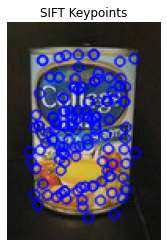

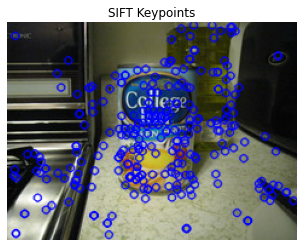

In [28]:
model_chicken = cv2.imread('./data/chickenbroth/model_chickenbroth.jpg')
chicken3 = cv2.imread('./data/chickenbroth/chickenbroth_03.jpg')
sift_kp, sift_descirptors = SIFT_descriptor(model_chicken, True)
sift_kp3, sift_descirptors3 = SIFT_descriptor(chicken3, True)

##### 3.1 - Finding corresponding points using SIFT: 
---
Use the guidelines from 3.0.1 and implement the function `getPoints_SIFT()`, which gets two images and outputs `p1,p2` SIFT keypoints, where `p1[j],p2[j]` are pairs of cooresponding points between `im1` and `im2`.

In [29]:
def getPoints_SIFT(im1, im2, k=None): #added input k - max points to add to the array
    if len(im1.shape)==3: im1=cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
    if len(im2.shape)==3: im2=cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
    sift = cv2.xfeatures2d.SIFT_create()
    sift_keypoints1, sift_descriptors1 = sift.detectAndCompute(im1,None)
    sift_keypoints2, sift_descriptors2 = sift.detectAndCompute(im2,None)
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(sift_descriptors1,sift_descriptors2)
    matches = sorted(matches, key = lambda x:x.distance)
    kp1_coords, kp2_coords = [], []

    for i, m in enumerate(matches):
        im1kp_matched_idx = m.queryIdx
        im2kp_matched_idx = m.trainIdx
        (x1, y1) = sift_keypoints1[im1kp_matched_idx].pt
        (x2, y2) = sift_keypoints2[im2kp_matched_idx].pt

        kp1_coords.append((x1, y1))
        kp2_coords.append((x2, y2))
        if k:
            if i>=k: break
    p1 = np.matrix(kp1_coords)
    p2 = np.matrix(kp2_coords)
    p1, p2 = p1.T, p2.T
    return p1, p2

Inputs: `im1` and `im2` are two 2D grayscale images. 

Output: `p1` and `p2` should be $2\times N$ matrices of corresponding $(x,y)^T$ coordinates between two images ($N$ is the number of corrosponding points you want to extract.). 

* You can also use color images instead of grayscale images, just state it in the report.

#### 3.2 - Calculate transformation: 
---

Implement a function that gets a set of matching points between two images and calculates the transformation between them. The transformation should be $3\times3$ $H$ homogenous matrix such that for each point in image $p\in C_1$, there would be a transformation in image $C_2$ such that $p=Hq$, $q\in C_2$.

In [30]:
def computeH(p1, p2):
    A = []
    for col in range(0, p1.shape[1]):
        (u, v) = (p1[0, col], p1[1, col])
        (x, y) = (p2[0, col], p2[1, col])
        eq1_row = [x, y, 1, 0, 0, 0, -x*u, -y*u, -u]
        eq2_row = [0, 0 ,0, x, y, 1,  -x*v, -y*v, -v]
        A.append(eq1_row)
        A.append(eq2_row)
    A = np.array(A)
    _, _, vh = np.linalg.svd(A)
    H2to1 = np.reshape(vh.T[:,-1], [3, 3])
    H2to1 /= H2to1[2, 2]
    return H2to1

Inputs: `p1` and `p2` should be $2\times N$ matrices of corresponding $(x,y)^T$ coordinates between two images. 

Outputs: `H2to1` should be a $3\times 3$ matrix encoding the homography that best matches the linear equation derived above for Equation 2. 

Hint: Remember that a homography is only determined up to scale. The `numpy`'s functions `eig()` or `svd()` will be useful. Note that this function can be written without an explicit for-loop over the data points.

*Hint for debugging*: A good test of your code is to check that the homography of an image with itself is an identity.

* Implement the computation function, describe and explain your implementation.
* Show that the transformation is correct by selecting arbitrary points in the first image and projecting them to the second image.

In [31]:
p1_check, p2_check = getPoints_SIFT(chicken3, chicken3, 20)
eye = np.eye(3,3)
H_check = computeH(p1_check, p2_check)
print(f'Checking if H=I for two identical images ("Chickenbroth3"). The resulted H is:\n{H_check}')
print(np.allclose(H_check, eye))

Checking if H=I for two identical images ("Chickenbroth3"). The resulted H is:
[[ 1.00000000e+00 -3.00462920e-17 -1.29250301e-13]
 [ 6.69281154e-16  1.00000000e+00  2.77944632e-14]
 [-1.12673595e-18  4.50694380e-18  1.00000000e+00]]
True


In [32]:
incline_L = cv2.imread('./data/incline_L.png')
incline_R = cv2.imread('./data/incline_R.png')

p1, p2 = getPoints_SIFT(incline_L, incline_R, 40)
H2to1 = computeH(p1, p2)

p2_homo = np.vstack((p2, np.ones(p2.shape[1])))
p1_proj_homo = H2to1 @ p2_homo
p1_proj_homo = p1_proj_homo / p1_proj_homo[2,:]
p1_pred = p1_proj_homo[:2,:]

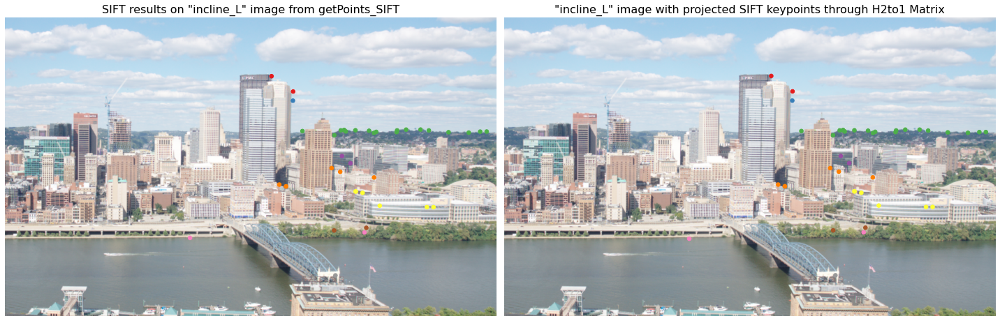

In [33]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

ax1.imshow(cv2.cvtColor(incline_L, cv2.COLOR_BGR2RGB))
ax1.scatter(np.asarray(p1[0]).reshape(-1), np.asarray(p1[1]).reshape(-1),
            s=30, c=np.asarray(p1_pred[1]).reshape(-1), cmap = 'Set1')
ax1.set_title('SIFT results on "incline_L" image from getPoints_SIFT', fontsize=16)
ax1.axis('off')

ax2.imshow(cv2.cvtColor(incline_L, cv2.COLOR_BGR2RGB))
ax2.scatter(np.asarray(p1_pred[0]).reshape(-1), np.asarray(p1_pred[1]).reshape(-1),
            s=30,c=np.asarray(p1_pred[1]).reshape(-1), cmap = 'Set1')
ax2.set_title('"incline_L" image with projected SIFT keypoints through H2to1 Matrix',fontsize=16)
ax2.axis('off')
plt.tight_layout(), plt.show();

Comparing the keypoints on the two images:

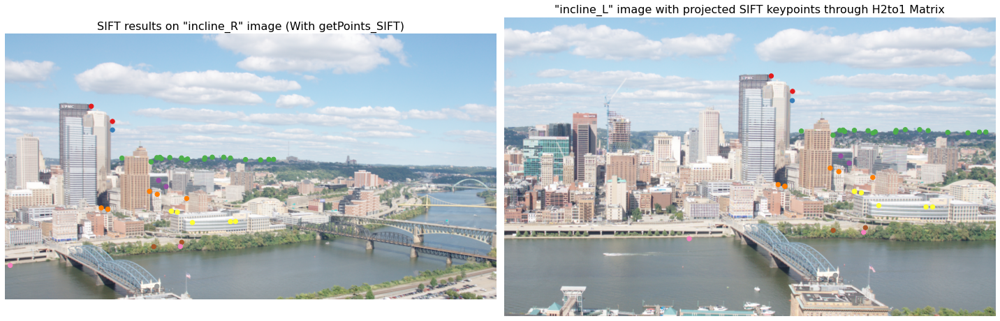

In [34]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,15))

ax1.imshow(cv2.cvtColor(incline_R, cv2.COLOR_BGR2RGB))
ax1.scatter(np.asarray(p2[0]).reshape(-1), np.asarray(p2[1]).reshape(-1), s=40,
            c=np.asarray(p1_pred[1]).reshape(-1), cmap='Set1')
ax1.set_title('SIFT results on "incline_R" image (With getPoints_SIFT)', fontsize=16)
ax1.axis('off')

ax2.imshow(cv2.cvtColor(incline_L, cv2.COLOR_BGR2RGB))
ax2.scatter(np.asarray(p1_pred[0]).reshape(-1), np.asarray(p1_pred[1]).reshape(-1),
            s=40,c=np.asarray(p1_pred[1]).reshape(-1), cmap='Set1')
ax2.set_title('"incline_L" image with projected SIFT keypoints through H2to1 Matrix',fontsize=16)
ax2.axis('off')
plt.tight_layout(), plt.show();


#### 3.3 - Image warping:
---
Implement a function that gets an input image and a transformation matrix H and returns the warped image. Please note that after the warping, there will be coordinates that won’t be integers (e.g. sub-pixels). Therefore you will need to interpolate between neighboring pixels. For color images, warp the image for each color channel and then connect them together. In order to avoid holes, use inverse warping.

Implement the wrapping function using numpy and SciPy interp2d() or RegularGridInterpolator() function .
Discuss the influences of different interpolations kinds {‘linear’, ‘cubic’}.
Note: When performing a multi-step algorithm, you need to demonstrate and explain each of those additional improvments.


In [35]:
#This function receives an image and a homography matrix H, and returns the warp info such as the warp size, the new H that includes the translation of the
# bbox to the origin and the bbox coordinates
def warp_info (img, H):
  orig_left_top_point = np.array([0,0,1])
  orig_left_bottom_point = np.array([0, img.shape[0],1])
  orig_right_top_point = np.array([img.shape[1], 0,1])
  orig_right_bottom_point = np.array([img.shape[1], img.shape[0],1])

  left_top_point = H @ orig_left_top_point
  left_bottom_point = H @ orig_left_bottom_point
  right_top_point = H @ orig_right_top_point
  right_bottom_point = H @ orig_right_bottom_point


  left_top_point /= left_top_point[2]
  left_bottom_point /= left_bottom_point[2]
  right_top_point /= right_top_point[2]
  right_bottom_point /= right_bottom_point[2]

  left = min(left_top_point[0], left_bottom_point[0])
  right = max(right_top_point[0], right_bottom_point[0])
  top = min(left_top_point[1], right_top_point[1])
  bottom = max(left_bottom_point[1], right_bottom_point[1])

  warp_size = (int(abs(right-left)),int(abs(bottom-top)))
  bbox = [int(top), int(bottom), int(left), int(right)]

  translation_mat = np.array([[1, 0, -left], [0, 1, -top], [0, 0, 1]])
  H = translation_mat @ H

  return warp_size, H, bbox

In [36]:
from scipy.interpolate import interp2d
def warpH(im1, H, out_size, kind='linear'):
    h, w = out_size
    warp_im1 = np.zeros((h, w, 3))
    H_inv = np.linalg.inv(H)

    x_src = np.arange(im1.shape[1])
    y_src = np.arange(im1.shape[0])
    R_interp = interp2d(x_src, y_src, im1[:, :, 0], kind=kind, fill_value=0)
    G_interp = interp2d(x_src, y_src, im1[:, :, 1], kind=kind, fill_value=0)
    B_interp = interp2d(x_src, y_src, im1[:, :, 2], kind=kind, fill_value=0)
    for y_out in range(h):
        for x_out in range(w):
            out_coords_homo = np.array([x_out, y_out, 1])
            in_coords_homo = H_inv @ out_coords_homo
            in_coords_homo /= in_coords_homo[-1]
            x_src, y_src = in_coords_homo[:2]

            if 0<= x_src < im1.shape[1] and 0<= y_src < im1.shape[0]:
                warp_im1[y_out, x_out] = [R_interp(x_src, y_src), G_interp(x_src, y_src), B_interp(x_src, y_src)]

    warp_im1 = warp_im1.astype('int')
    return warp_im1

Inputs: `im1` is a colored image. `H` is a  matrix encoding the homography between im1 and im2. `out_size` is the size of the wanted output (new_imH,new_imW).

Output: `warp_im1` is the warped image im1 including empty background (zeros).

In [37]:
warp_size, H_t, warp_bbox = warp_info(incline_R, H2to1)
warped_linear = warpH(incline_R, H_t, warp_size[::-1])
warped_cubic = warpH(incline_R, H_t, warp_size[::-1], kind='cubic')

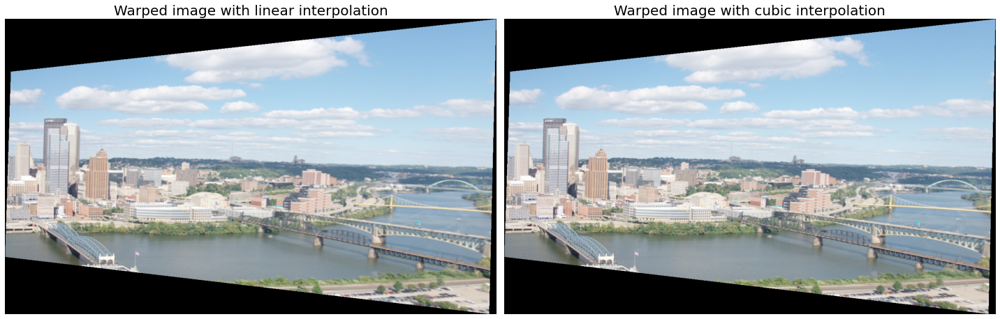

In [38]:
warped_linear = cv2.cvtColor(cv2.convertScaleAbs(warped_linear), cv2.COLOR_BGR2RGB)
warped_cubic = cv2.cvtColor(cv2.convertScaleAbs(warped_cubic), cv2.COLOR_BGR2RGB)
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(20,20))

ax1.imshow(warped_linear)
ax1.axis('off')
ax1.set_title('Warped image with linear interpolation', fontsize=20)

ax2.imshow(warped_cubic)
ax2.axis('off')
ax2.set_title('Warped image with cubic interpolation', fontsize=20)

plt.tight_layout(), plt.show();


##### 3.4 - Panorama stitching:
---
Implement a function that gets two images after axis alignment (using OpenCV's `warpPerspective`)
and returns a union of the two. The union should be a simple overlay of one image on the other. Leave empty pixels painted black.


In [39]:
def resize_for_stitching(im2, warp_im1, bbox):
    warp_y_top, warp_x_left = bbox[0], bbox[2]

    shape_y = max(max(0, -warp_y_top) + im2.shape[0], max(0, warp_y_top) + warp_im1.shape[0])
    shape_x = max(max(0, -warp_x_left) + im2.shape[1], max(0, warp_x_left) + warp_im1.shape[1])

    warp_im1_resized = np.zeros((shape_y, shape_x, 3), dtype='uint8')
    im2_resized = np.zeros(warp_im1_resized.shape, dtype='uint8')

    im2_resized[max(0, -warp_y_top):max(0, -warp_y_top) + im2.shape[0], max(0, -warp_x_left):max(0, -warp_x_left) + im2.shape[1]] = im2
    warp_im1_resized[max(0, warp_y_top):max(0, warp_y_top) + warp_im1.shape[0], max(0, warp_x_left):max(0, warp_x_left) + warp_im1.shape[1]] = warp_im1

    return warp_im1_resized, im2_resized

def imageStitching(img1, warp_img2):
    panoImg = np.maximum(img1, warp_img2)
    panoImg = np.uint8(panoImg)
    return panoImg

def panorama(im1, im2, k):
    p1, p2 = getPoints_SIFT(im1,im2,k)
    H = computeH(p1, p2)

    warp_size, H_t, bbox = warp_info (im2, H)
    # warp_im2 = warpH(im2, H_t, warp_size[::-1])
    warp_im2 = cv2.warpPerspective(im2, H_t, warp_size, cv2.WARP_INVERSE_MAP, flags=cv2.INTER_LINEAR) #Using cv2.warpPerspective
    warp_im2_scaled, im1_scaled = resize_for_stitching(im1, warp_im2, bbox)
    panorama_img = imageStitching(im1_scaled, warp_im2_scaled)
    return panorama_img

In [40]:
incline_test = panorama(incline_L, incline_R, k=50)

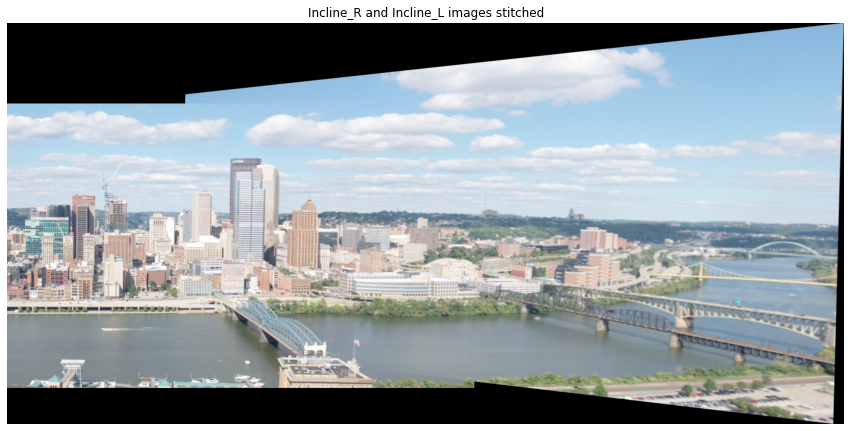

In [41]:
plt.figure(figsize=(15,20))
plt.imshow(cv2.cvtColor(incline_test, cv2.COLOR_BGR2RGB))
plt.title('Incline_R and Incline_L images stitched')
plt.axis('off')
plt.show();

Inputs: `im1`,`warp_img2` are two colored images. 

Output: `panoImg` is the gathered output  panorama.

* Use all the above functions to create a panorama image. Demonstrate and explain you results on the `./data/incline` images.

##### 3.5 - Several Images stitching:
---
* Show the results of the panoramas on the attached images of the beach (`./data/beach`) and Pena National Sintra Palace (`./data/sintra`) for the entire set of images.

* Note: When using SIFT without RANSAC (next section), take the top K matches for estimating the homography. 
  * What happens if you don't do so? Why is that?

In [42]:
#We'll be first downscale the sintra images since they are very large.
sintra_imgs = []
for f in os.listdir('./data/sintra'):
    image_path = os.path.join('./data/sintra', f)
    sintra = cv2.imread(image_path)
    sintra = cv2.resize(sintra, (sintra.shape[1] // 2 , sintra.shape[0] // 2), interpolation = cv2.INTER_AREA)
    sintra_imgs.append(sintra)
beach_imgs = []
for f in os.listdir('./data/beach'):
    image_path = os.path.join('./data/beach', f)
    beach = cv2.imread(image_path)
    beach = cv2.resize(beach, (beach.shape[1] // 2 , beach.shape[0] // 2), interpolation = cv2.INTER_AREA)
    beach_imgs.append(beach)

In [43]:
stitch_1_0 = panorama(sintra_imgs[1], sintra_imgs[0], 50)
stitch_3_4= panorama(sintra_imgs[3], sintra_imgs[4], 50)
stitch_2_1_0= panorama(sintra_imgs[2],stitch_1_0, 50)
stitch_0_1_2_3_4= panorama(stitch_2_1_0, stitch_3_4, 50)

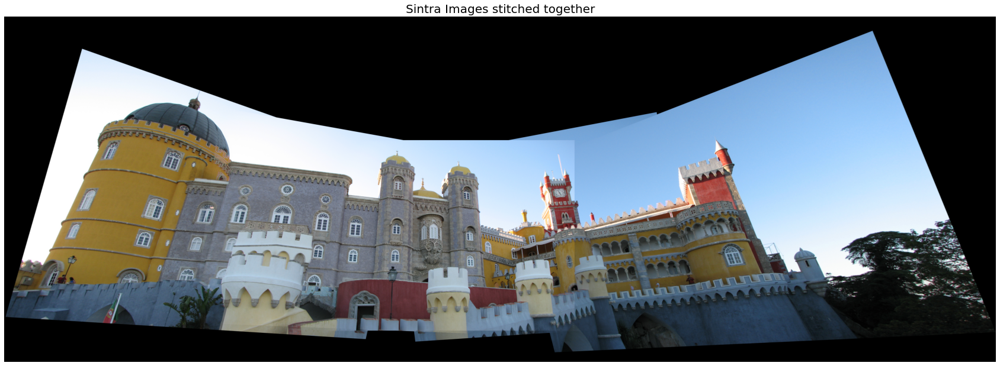

In [44]:
plt.figure(figsize=(30, 30))
plt.imshow(cv2.cvtColor(stitch_0_1_2_3_4, cv2.COLOR_BGR2RGB))
plt.title('Sintra Images stitched together', fontsize=20)
plt.axis('off')
plt.show();

In [45]:
stitch_3_4= panorama(beach_imgs[3], beach_imgs[4], 25)
stitch_2_3_4 = panorama(beach_imgs[2], stitch_3_4, 25)
stitch_1234 = panorama(stitch_2_3_4, beach_imgs[1], 25)
stitch_f = panorama(stitch_1234, beach_imgs[0], 25)

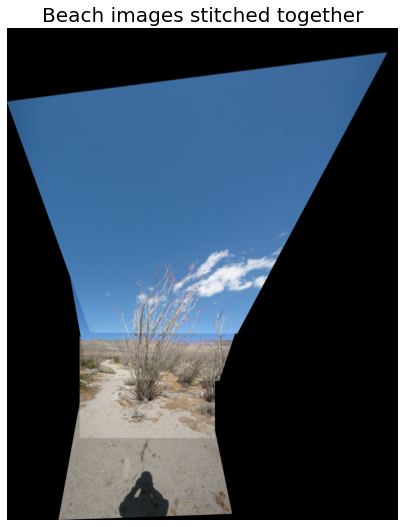

In [46]:
plt.figure(figsize=(7, 10))
plt.imshow(cv2.cvtColor(stitch_f, cv2.COLOR_BGR2RGB))
plt.title('Beach images stitched together', fontsize=20)
plt.axis('off')
plt.show();

##### 3.6 - RANSAC:
---
Added bellow is an implementation of the RANSAC (**Ran**dom **Sa**mple **C**onsensus) algorithm. 
* Explain when it is needed and why.
* Copmare between using RANSAC vs. not using it for creating the panoran images of the beach and SINTRA. Explain.
* What could have been done to get better results?

In [47]:
def ransacH(p1, p2, nIter=30000, tol=0.8):
    N = p1.shape[1]
    stacked_p2 = np.vstack((p2, np.ones(N)))

    best_inliers_n = 0
    best_inliers = []

    for iter in range(nIter):
        rand_idxs = np.random.choice(np.arange(N), 4, replace=False)
        chosen_p1 = p1[:, rand_idxs]
        chosen_p2 = p2[:, rand_idxs]
        H2to1 = computeH(chosen_p1, chosen_p2)
        p2in1 = H2to1 @ stacked_p2
        p2in1 = p2in1 / p2in1[2, :]
        p2in1 = p2in1[0:2, :]
        L2dists = np.linalg.norm(p2in1 - p1, axis=0)
        inliers = (p1[:, L2dists < tol], p2[:, L2dists < tol])
        n_inliers = np.sum(L2dists < tol)
        if n_inliers > best_inliers_n:
            best_inliers_n = n_inliers
            best_inliers = inliers

    bestH = computeH(best_inliers[0], best_inliers[1])
    return bestH

We'll modify our functions in order to use RANSAC:

In [48]:
def panorama_ransac(im1, im2):
    p1, p2 = getPoints_SIFT(im1,im2)
    H = ransacH(p1, p2)

    warp_size, H_t, bbox = warp_info (im2, H)
    # warp_im2 = warpH(im2, H_t, warp_size[::-1])
    warp_im2 = cv2.warpPerspective(im2, H_t, warp_size, cv2.WARP_INVERSE_MAP, flags=cv2.INTER_LINEAR) #Using cv2.warpPerspective
    warp_im2_scaled, im1_scaled = resize_for_stitching(im1, warp_im2, bbox)
    panorama_img = imageStitching(im1_scaled, warp_im2_scaled)
    return panorama_img

In [49]:
stitch_1_0 = panorama_ransac(sintra_imgs[1], sintra_imgs[0])
stitch_3_4= panorama_ransac(sintra_imgs[3], sintra_imgs[4])
stitch_2_1_0= panorama_ransac(sintra_imgs[2],stitch_1_0)
stitch_0_1_2_3_4= panorama_ransac(stitch_2_1_0, stitch_3_4)

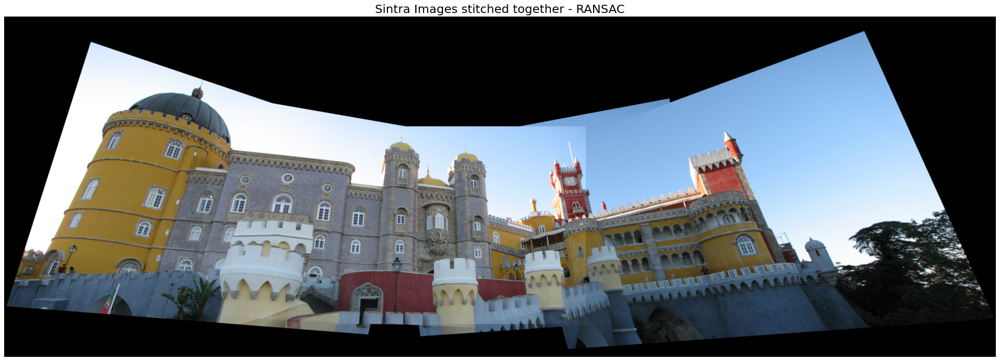

In [50]:
plt.figure(figsize=(30, 30))
plt.imshow(cv2.cvtColor(stitch_0_1_2_3_4, cv2.COLOR_BGR2RGB))
plt.title('Sintra Images stitched together - RANSAC', fontsize=20)
plt.axis('off')
plt.show();

In [51]:
stitch_3_4= panorama_ransac(beach_imgs[3], beach_imgs[4])
stitch_2_3_4 = panorama_ransac(beach_imgs[2], stitch_3_4)
stitch_1234 = panorama_ransac(stitch_2_3_4, beach_imgs[1])
stitch_f = panorama_ransac(stitch_1234, beach_imgs[0])

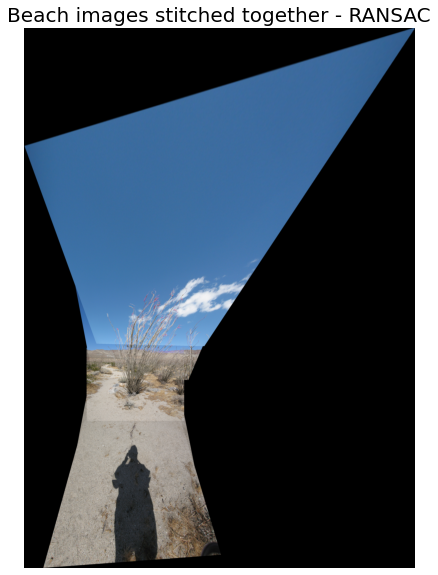

In [52]:
plt.figure(figsize=(7, 10))
plt.imshow(cv2.cvtColor(stitch_f, cv2.COLOR_BGR2RGB))
plt.title('Beach images stitched together - RANSAC', fontsize=20)
plt.axis('off')
plt.show();

Inputs: 
* `p1` and `p2` are matrices specifying point locations in each of the images and `p1[j]`,`p2[j]` are matched points between two images.

* `nIter` is the number of iterations to run RANSAC  

* `tol` is the tolerance value for considering a point to be an inlier. 

 * Define your function so that these  `nIter` and  `tol` have reasonable default values.

Outputs: 
* `bestH` is the homography model with the most inliers found during RANSAC

##### 3.7 - Be Creative:
---
* Go out and take at least 3 pictures of a far distance object (e.g. a building), and use what you have learned to create a new excellent Panorama image.
  * Add the resulted image to your report and to the `output` folder.

In [53]:
path = './data/my_data/panorama'
balc_imgs = []
for f in os.listdir(path):
    image_path = os.path.join(path, f)
    balc = cv2.imread(image_path)
    balc = cv2.resize(balc, (balc.shape[1] // 4 , balc.shape[0] // 4), interpolation = cv2.INTER_AREA)
    balc_imgs.append(balc)

In [54]:
stitch_12 = panorama_ransac(balc_imgs[1], balc_imgs[2])
stitch_f= panorama_ransac(stitch_12, balc_imgs[0])

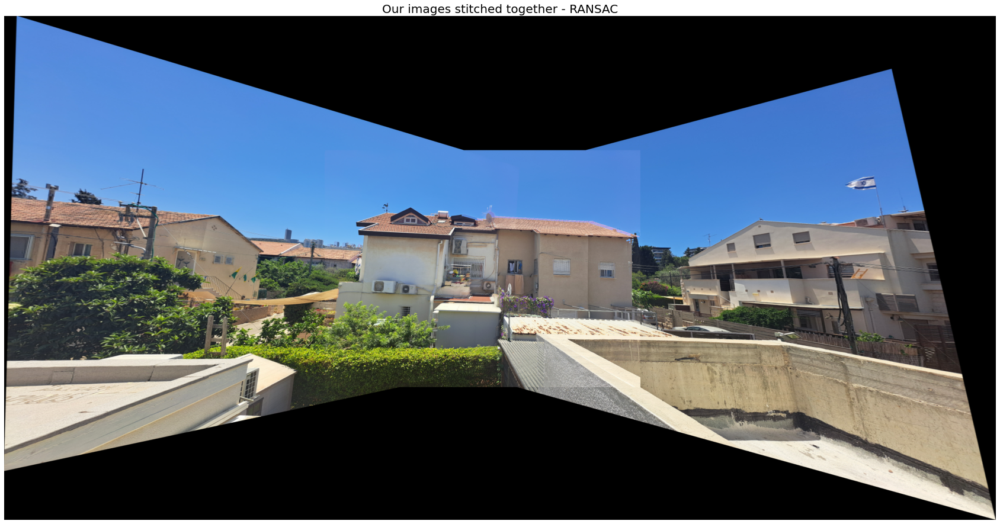

In [55]:
plt.figure(figsize=(30, 30))
plt.imshow(cv2.cvtColor(stitch_f, cv2.COLOR_BGR2RGB))
plt.title('Our images stitched together - RANSAC', fontsize=20)
plt.axis('off')
plt.show();

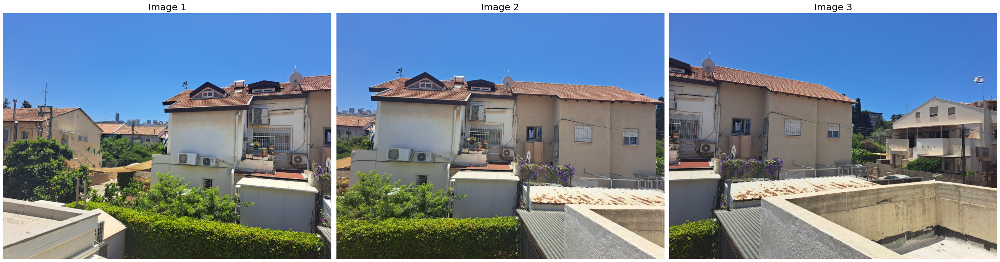

In [56]:
fig, axs = plt.subplots(1, 3, figsize=(30,30))
for i, ax in enumerate(axs.ravel()):
    ax.imshow(cv2.cvtColor(balc_imgs[i], cv2.COLOR_BGR2RGB))
    ax.set_title(f'Image {i+1}', fontsize=20)
    ax.set_axis_off()
plt.tight_layout(), plt.show();

---
## <img src="https://img.icons8.com/dusk/64/000000/prize.png" style="height:50px;display:inline"> Credits
* Images from <a href="http://www.image-net.org/">Imagenet</a>
* Videos from <a href="https://pixabay.com/videos/search/green%20screen/">Pixabay</a>
    * Dinosaur video from <a href="https://sites.google.com/a/sau17.net/modern-media/home/green-screen-animations">Modern Media</a>
* Icons from <a href="https://icons8.com/">Icon8.com</a> - https://icons8.com